# Clustering

In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
# import libraries
import numpy as np
import matplotlib as mp
import pandas as pd
import matplotlib.pyplot as plt
import pandas as pd
import slideUtilities as sl
import laUtilities as ut
from importlib import reload
from datetime import datetime
from IPython.display import Image
from IPython.display import display_html
from IPython.display import display
from IPython.display import Math
from IPython.display import Latex
from IPython.display import HTML
print('')

In [4]:
%%html
<style>
 .container.slides .celltoolbar, .container.slides .hide-in-slideshow {
    display: None ! important;
}
</style>

%Set up useful MathJax (Latex) macros.
%See http://docs.mathjax.org/en/latest/tex.html#defining-tex-macros
%These are for use in the slideshow
$\newcommand{\mat}[1]{\left[\begin{array}#1\end{array}\right]}$
$\newcommand{\vx}{{\mathbf x}}$
$\newcommand{\hx}{\hat{\mathbf x}}$
$\newcommand{\vbt}{{\mathbf\beta}}$
$\newcommand{\vy}{{\mathbf y}}$
$\newcommand{\vz}{{\mathbf z}}$
$\newcommand{\R}{{\mathbb{R}}}$
$\newcommand{\vu}{{\mathbf u}}$
$\newcommand{\vv}{{\mathbf v}}$
$\newcommand{\vw}{{\mathbf w}}$
$\newcommand{\col}{{\operatorname{Col}}}$
$\newcommand{\nul}{{\operatorname{Nul}}}$
$\newcommand{\vb}{{\mathbf b}}$
$\newcommand{\va}{{\mathbf a}}$
$\newcommand{\ve}{{\mathbf e}}$
$\newcommand{\setb}{{\mathcal{B}}}$
$\newcommand{\rank}{{\operatorname{rank}}}$
$\newcommand{\vp}{{\mathbf p}}$

__1854:__ Cholera outbreak in Soho, London.   

Common wisdom at the time was that disease spread by breathing "foul air" (miasma).

In 10 days, 500 people in the area died.  

John Snow: local physician.

Sewer system had not yet reached Soho.  Most homes had cesspits under the floor.

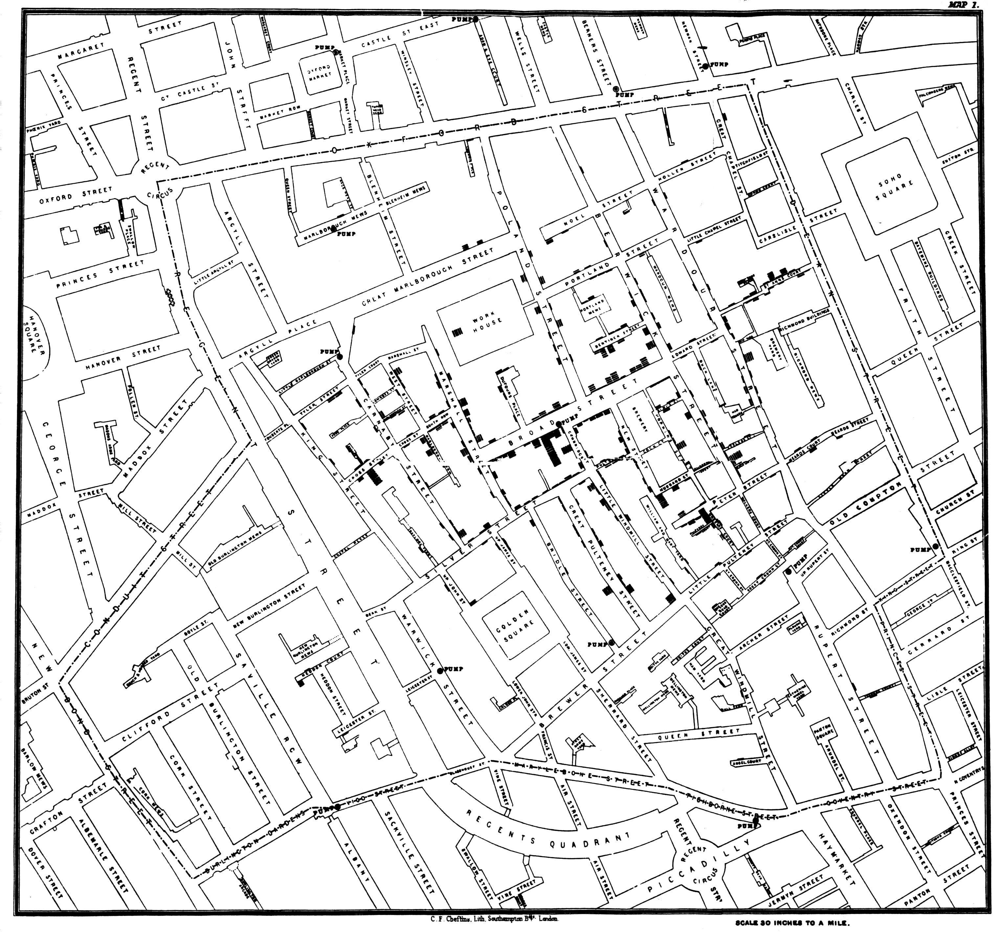

In [5]:
sl.hide_code_in_slideshow()
display(Image("figs/L6-Snow-cholera-map-1.png", width=550))

By John Snow - Published by C.F. Cheffins, Lith, Southhampton Buildings, London, England, 1854 in Snow, John. On the Mode of Communication of Cholera, 2nd Ed, John Churchill, New Burlington Street, London, England, 1855.

(This image was originally from <a class="external text" href="http://en.wikipedia.org">en.wikipedia</a>; description page is/was <a class="external text" href="http://en.wikipedia.org/w/index.php?title=Image%3ASnow-cholera-map-1.jpg">here</a>. Image copied from<a rel="nofollow" class="external free" href="http://matrix.msu.edu/~johnsnow/images/online_companion/chapter_images/fig12-5.jpg">http://matrix.msu.edu/~johnsnow/images/online_companion/chapter_images/fig12-5.jpg</a>), Public Domain, <a href="https://commons.wikimedia.org/w/index.php?curid=2278605">https://commons.wikimedia.org/w/index.php?curid=2278605</a>

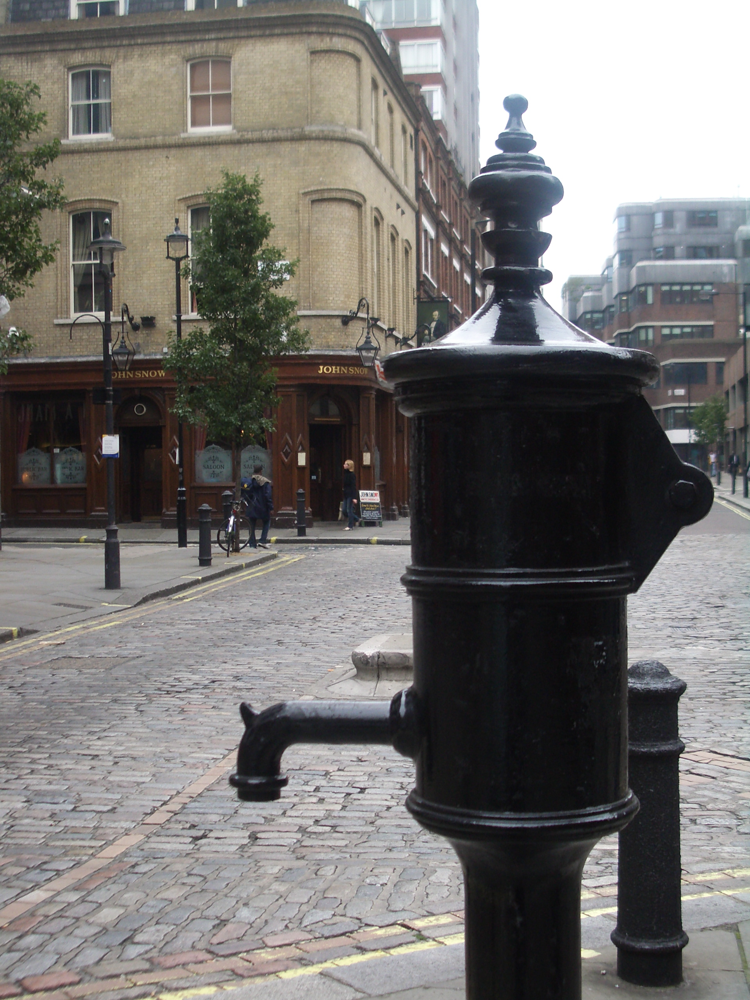

In [6]:
sl.hide_code_in_slideshow()
display(Image("figs/L6-John_Snow_memorial_and_pub.png", width=550))

<a href="http://creativecommons.org/licenses/by-sa/2.0" title="Creative Commons Attribution-Share Alike 2.0">CC BY-SA 2.0</a>, <a href="https://commons.wikimedia.org/w/index.php?curid=357998">https://commons.wikimedia.org/w/index.php?curid=357998</a>

## Clustering

Clustering is a very important way of discovering __structure__ in data.

It is so important because it is __common__ for data to show clusters.

* Locations where millionaires live
* The number of hours people work each week
* Demographics ("soccer moms", "bored retirees", "unemployed millenials", etc)


However, these categories or "labels" have been assigned __after__ the fact.

When we do clustering, we first find clusters, then __interpret__ or "assign labels."

That is, clustering represents the first example we will see of __unsupervised__ learning.

__Supervised__ methods:  Data items have labels, and we want to learn a function that correctly assigns labels to new data items.

__Unsupervised__ methods:  Data items do not have labels, and we want to learn a function that extracts  important patterns from the data.

__Feature scaling__

When constructing or selecting a distance metric, one needs to think carefully about the scale of the features being used.

For example, consider the case where we are clustering people based on their age, income, and gender.

We might use age in years, income in dollars, and assign gender to the values $\{0, 1\}$.

Thus, the following records:

* Joe Smith, age 27, income USD 75,000, male
* Eve Jones, age 45, income USD 42,000, female

Would be encoded in feature space as:

$$\mat{{c}27\\75000\\0},\mat{{c}45\\42000\\1} $$

What would happen if we used Euclidean distance as our dissimilarity metric in this feature space?

Clearly, the influence of income would dominate the other two features.  For example, a difference of gender is about as significant as a difference of one dollar of yearly income.

We are unlikely to expose gender-based differences if we cluster using this representation.

The most common way to handle this is __feature scaling.__

The basic idea is to rescale each feature separately, so that its range of values is about the same as all other features.

For example, one may choose to:
    
* shift each feature independently by subtracting the mean over all observed values
    * This means that each feature is now centered on zero
* then rescale each feature so that the standard deviation overall observed values is 1.
    * This means that the feature will have about the same range of values as all the others.

For example, let's work with Bortkiewicz's famous horse-kick data:

In [22]:
# source: http://www.randomservices.org/random/data/HorseKicks.html
import pandas as pd
df = pd.read_table('data/HorseKicks.txt',index_col='Year',dtype='float')
counts = df.sum(axis=1)
counts

Year
1875.0     3.0
1876.0     5.0
1877.0     7.0
1878.0     9.0
1879.0    10.0
1880.0    18.0
1881.0     6.0
1882.0    14.0
1883.0    11.0
1884.0     9.0
1885.0     5.0
1886.0    11.0
1887.0    15.0
1888.0     6.0
1889.0    11.0
1890.0    17.0
1891.0    12.0
1892.0    15.0
1893.0     8.0
1894.0     4.0
dtype: float64

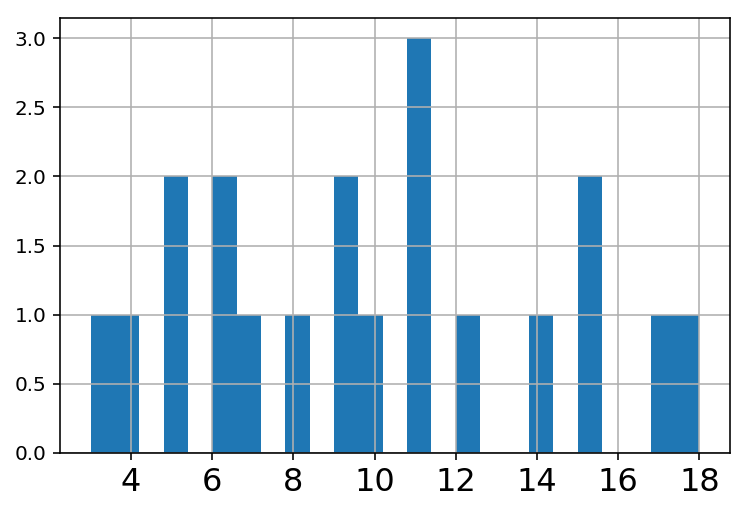

In [25]:
_ = counts.hist(bins=25,xlabelsize=16)

In [9]:
counts.mean()

9.8

To standardize to zero mean and unit standard deviation, we can use tools from the `scikit-learn` library.

(We will discuss scikit-learn more in upcoming lectures.)

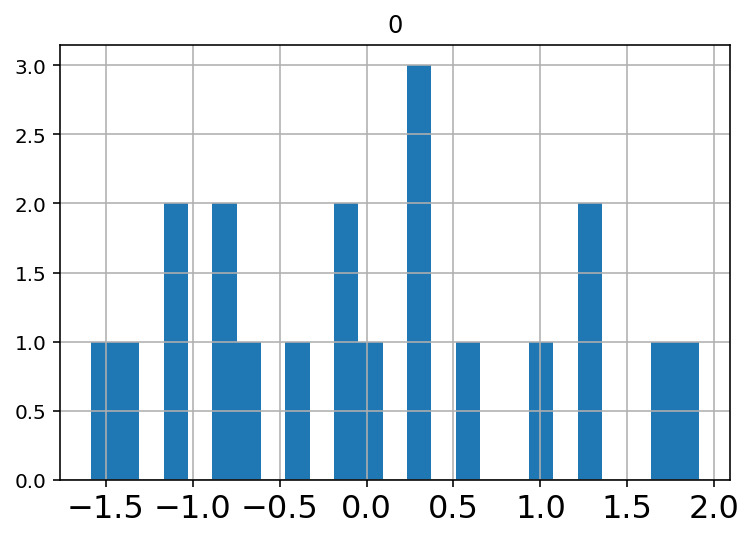

In [10]:
from sklearn import preprocessing
counts_scaled = pd.DataFrame(preprocessing.scale(counts))
_ = counts_scaled.hist(bins=25,xlabelsize=16)

In [11]:
counts_scaled.mean().values

array([ -1.77635684e-16])

Notice that values that used to be zero have now become negative.

In some situations it may not be sensible to change zeros into something else.  It may make more sense to map all values into a fixed range, for example $[0, 1]$.

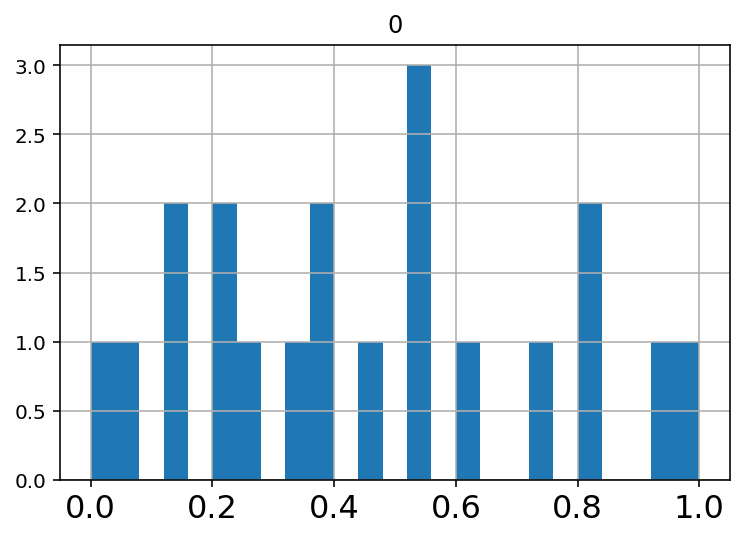

In [12]:
min_max_scaler = preprocessing.MinMaxScaler()
counts_minmax = min_max_scaler.fit_transform(counts.values.reshape(-1,1))
counts_minmax = pd.DataFrame(counts_minmax)
_ = counts_minmax.hist(bins=25,xlabelsize=16)

__Example Output from k-means__

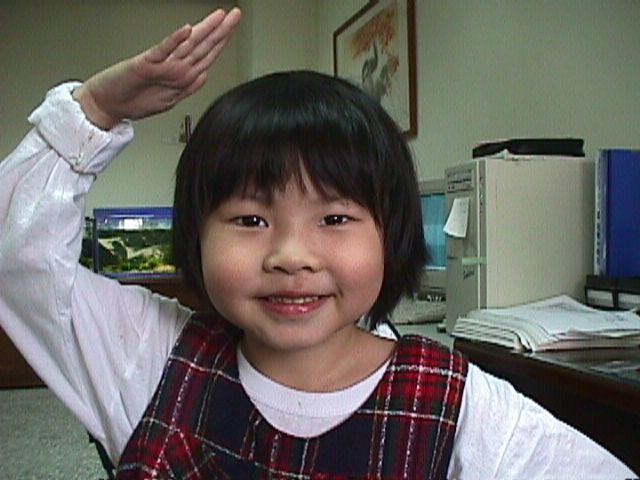

In [13]:
sl.hide_code_in_slideshow()
display(Image("figs/L6-annie19980405.jpg", width=350))

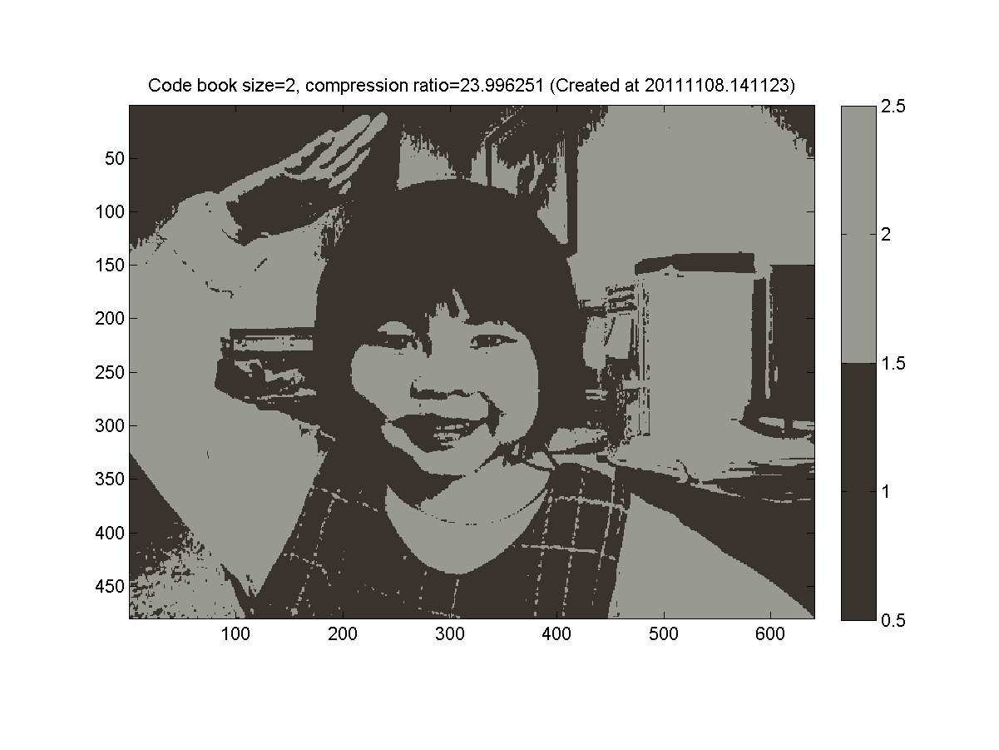

In [14]:
sl.hide_code_in_slideshow()
display(Image("figs/L6-annie_002.png", width=550))

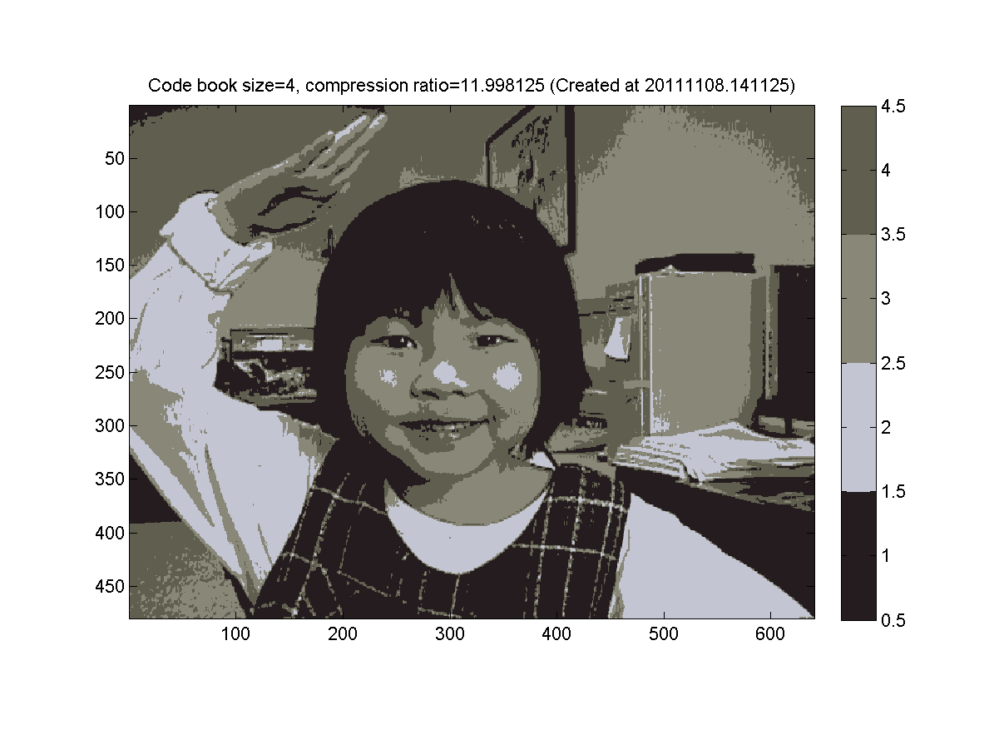

In [15]:
sl.hide_code_in_slideshow()
display(Image("figs/L6-annie_004.png", width=550))  

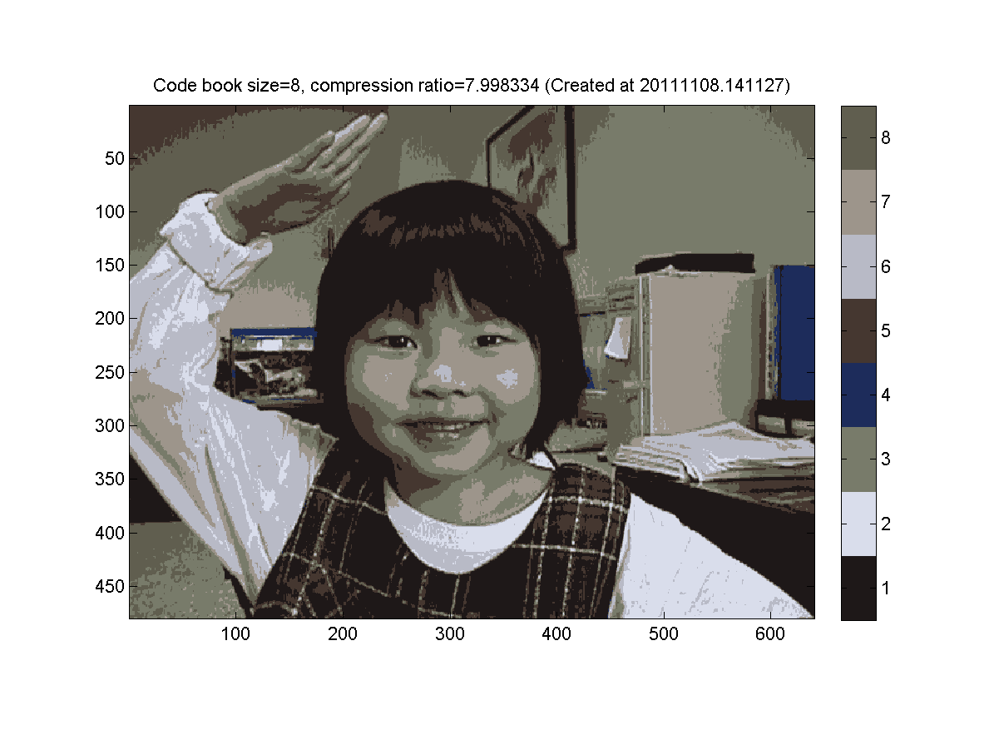

In [16]:
sl.hide_code_in_slideshow()
display(Image("figs/L6-annie_008.png", width=550)) 

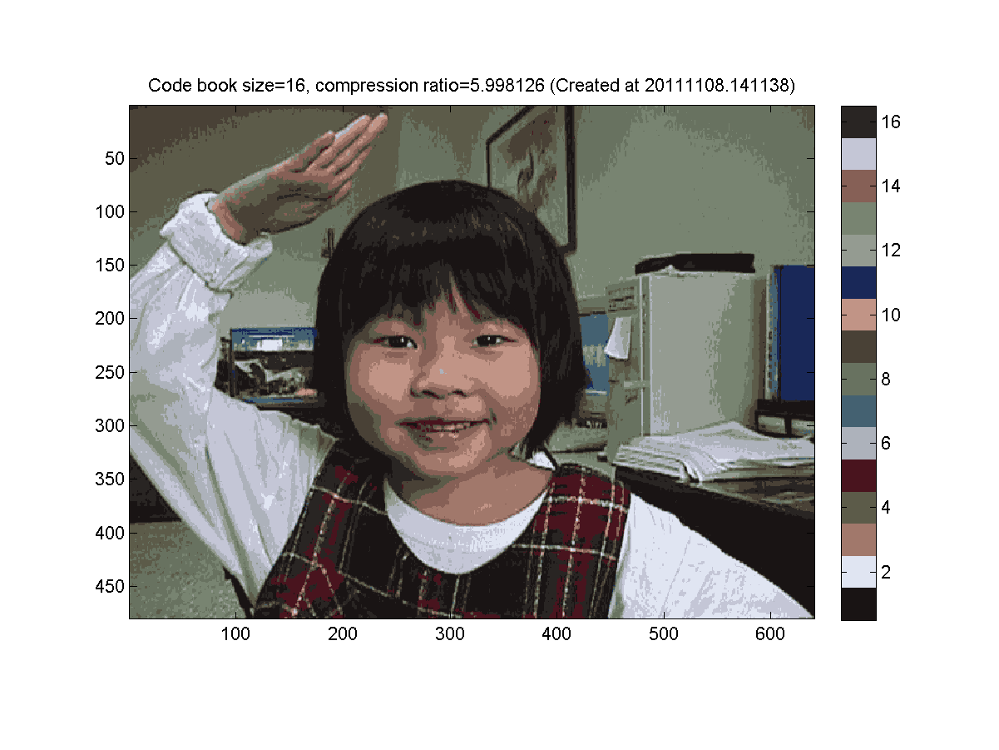

In [17]:
sl.hide_code_in_slideshow()
display(Image("figs/L6-annie_016.png", width=550)) 